In [422]:
library( tidyverse )
library( highcharter )
library( knitr )
library( pander )
library( tidyverse )
library( ggplot2 )
library( doBy )
library( xtable )
library( ggthemes )
library( kableExtra )
library( viridis )
library( DiagrammeR )
library( magrittr )
library( RColorBrewer )
library(webshot)
library(hash)
library( miceadds )
library(zoo)
library(dplyr)
library(caret)
library(chron)
library(moments)

options(repr.plot.width = 20, repr.plot.height =10, repr.plot.res = 500)

In [423]:
load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_iniziale.Rdata")
df <- DatiUsati1
rm(DatiUsati1)

In [424]:
load(file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/val_score.Rdata")
df_val <- val_score
rm(val_score) #dati 2022

In [425]:
dim(df)

[1] 1475 1874

In [426]:
dim(df_val)

[1]  434 2011

Selezione delle variabili di interesse

In [427]:

df <- df[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [428]:
df_val <- df_val[c("patientKey","icuAdmDate__icuAdmDate","icuAdmDate__icuAdmTime","centreCode","genderClear","age","degenzaPreTra","admWard_RIC_PED",
           "typeStatus_RIC","pulmonarHypertension","epatopulmonarSyndrome",
           "BleedingEsophagGastric","prevLiverTransplant","presentRefractAscites","tipps",
           "thrombosisDegreeWithNone","portosystEncephalPresent","nutritStatus",
           "surgeonSurgery","mechanicVentilation","clifSofaForCardio","albumInfusOver7Days",
           "bilirubinaTotale","INR","serumCreatinine","Sodiemia","ratioPaO2FiO2","platCountTranspl","albumina",
           "surgeryDuration","IntraoperativTransfected","plasmaFresco","plasmaPools","doseFibrinogen","CRIOprecipitated",
           "useEmorecuper","CristalloidiComp","ColloidiComp","Albumina50Comp",
           "noradrenalineEndSurger","intermedLactates","coldIschemia","syndromeReperfus",
           "shuntPortedTemp", "anastomTechnic","venousBypass","bileAnastomosis","abdomOpenEndSurg",
           "organDonorSex","organDonorType","organDonorSampleTechnic","organDonorECMO",
           "regionalPerfusion","organDonorBiopsy","organDonorRecondOrgan",
           "organDonorProvenance","organDonorCauseOfDeath","organDonorAge", "organDonorHeight",
           "organDonorDrawalSodiemia","organDonorGammaGT","realMELD","realMELDNa","DRI","EDRI", "degenzaPostTraOSP",
           "hospOutcome_RIC","icuMortality",
           "liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease",
          "tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht",
           "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter",
          "comorbidities_none_RIC","comorbidities_asthma_RIC","comorbidities_modCOPD_RIC","comorbidities_sevCOPD_RIC",
        "comorbidities_restLunDis_RIC","comorbidities_hypertension_RIC","comorbidities_myocard_RIC","comorbidities_heartFail2_RIC",
        "comorbidities_heartFail4_RIC","comorbidities_arrhythmia_RIC","comorbidities_perVascDis_RIC","comorbidities_dementia_RIC",
        "comorbidities_cerDis_RIC","comorbidities_hemiParaQuadr_RIC","comorbidities_neuro_RIC","comorbidities_modRenal_RIC",
        "comorbidities_diab1_RIC","comorbidities_diab2NoIns_RIC","comorbidities_diab2Ins_RIC","comorbidities_drugIndCoag_RIC",
        "comorbidities_antiaggrTherapy_RIC","comorbidities_severePsychosis_RIC")]

In [429]:
df <- rbind(df,df_val) #unisco dati 2018-2021 con quelli del 2022

Sistemo variabili a scelta multipla o quelle subordinate alla selezione di una variabile precedente andando ad inserire il valore 0 al posto di NaN

In [430]:
listsub <- c("tip_ritr","oxygenTherapy","frequency","degree","organDonorMaastricht", "organDonorSteadyMacroscopic","organDonorRecondHypoNormoter")

In [431]:

listLivDis<-c("liverDisords_buddChiariSyndrome","liverDisords_cirrhosisAlcoholic","liverDisords_cirrhosisAutoimmune","liverDisords_cirrhosisBiliaryPrimitiv",
              "liverDisords_cirrhosisBiliarySecond","liverDisords_cirrhosisCryptogenetic","liverDisords_cirrhosisDrugs","liverDisords_cirrhosisOtherRaison",
              "liverDisords_cirrhosisVirusB","liverDisords_cirrhosisVirusC","liverDisords_cirrhosisVirusD","liverDisords_cirrhosisVirusOther","liverDisords_extraEpathiBileDucts",
              "liverDisords_HCCstageI","liverDisords_HCCstageII","liverDisords_Hemochromatosis","liverDisords_hepatFulm","liverDisords_NASHpathology",
              "liverDisords_otherCholestaticDisease","liverDisords_otherCongenitBilia","liverDisords_otherIndication","liverDisords_polycysticDisease",
              "liverDisords_primitScleroColangitis","liverDisords_subAcute","liverDisords_wilsonDisease")




In [432]:
fix_multi <- function(dati,lista){

   for (i in lista){
      levels(dati[[i]]) <- c(levels(dati[[i]]),0)
      dati[[i]][is.na(dati[[i]])] <- 0
   }

   return(dati)
}


In [433]:
#fill NA with 0 for pop up variables and multi choice vriables
df <- fix_multi(df, listLivDis)

In [434]:
df <- fix_multi(df,listsub)

In [435]:
dim(df)

[1] 1909  122

# Data exploration

Inizia la fase di esplorazione dei dati in cui per prima cosa vedo come è fatto il dataset

In [436]:
rownames(df) <- NULL
head(df)

patientKey,icuAdmDate__icuAdmDate,icuAdmDate__icuAdmTime,centreCode,genderClear,age,degenzaPreTra,admWard_RIC_PED,typeStatus_RIC,pulmonarHypertension,...,comorbidities_cerDis_RIC,comorbidities_hemiParaQuadr_RIC,comorbidities_neuro_RIC,comorbidities_modRenal_RIC,comorbidities_diab1_RIC,comorbidities_diab2NoIns_RIC,comorbidities_diab2Ins_RIC,comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC,comorbidities_severePsychosis_RIC
P-IT003-632,2018-10-22,15:30,IT003,Male,50,1,surgicalWard,emergSurgical,responsNo,...,0,0,0,0,0,1,0,0,0,0
P-IT126-4182,2018-01-01,16:16,IT126,Male,56,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4336,2018-03-23,16:37,IT126,Male,60,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4384,2018-04-09,13:03,IT126,Male,62,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0
P-IT126-4650,2018-09-09,11:45,IT126,Male,56,0,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,1,0,0,0
P-IT126-4675,2018-09-25,16:35,IT126,Male,61,1,medicalWard,emergSurgical,NA,...,0,0,0,0,0,0,0,0,0,0


Vedo struttura dataset, le informazioni generali che si ottengono sono numero righe e numero colonne, poi per ogni variabile viene indicato il tipo e se la variabile è categorica il numero di livelli

In [437]:
str(df)

'data.frame':	1909 obs. of  122 variables:
 $ patientKey                           : chr  "P-IT003-632" "P-IT126-4182" "P-IT126-4336" "P-IT126-4384" ...
 $ icuAdmDate__icuAdmDate               : Date, format: "2018-10-22" "2018-01-01" ...
 $ icuAdmDate__icuAdmTime               : chr  "15:30" "16:16" "16:37" "13:03" ...
 $ centreCode                           : chr  "IT003" "IT126" "IT126" "IT126" ...
 $ genderClear                          : Factor w/ 2 levels "Male","Female": 1 1 1 1 1 1 1 1 1 2 ...
 $ age                                  : num  50 56 60 62 56 61 57 61 58 65 ...
 $ degenzaPreTra                        : num  1 1 1 1 0 1 1 1 1 1 ...
 $ admWard_RIC_PED                      : Factor w/ 6 levels "medicalWard",..: 2 1 1 1 1 1 1 1 2 1 ...
 $ typeStatus_RIC                       : Factor w/ 3 levels "nonSurgical",..: 3 3 3 3 3 3 3 3 3 3 ...
 $ pulmonarHypertension                 : Factor w/ 2 levels "responsNo","responsYes": 1 NA NA NA NA NA NA NA NA 1 ...
 $ epatopulmonar

Viene data una sintesi del dataset, le informazioni per le variabili continue sono: valore minimo, primo quartile, mediana, media, terzo quartile e valore massimo. Per le variabili categoriche viene detto quanti valori ci sono per ogni livello

In [438]:
summary(df)

  patientKey        icuAdmDate__icuAdmDate icuAdmDate__icuAdmTime
 Length:1909        Min.   :2018-01-01     Length:1909           
 Class :character   1st Qu.:2019-11-06     Class :character      
 Mode  :character   Median :2020-12-22     Mode  :character      
                    Mean   :2020-11-16                           
                    3rd Qu.:2021-12-02                           
                    Max.   :2022-12-23                           
                                                                 
  centreCode        genderClear        age        degenzaPreTra     
 Length:1909        Male  :1370   Min.   : 0.00   Min.   :-260.000  
 Class :character   Female: 538   1st Qu.:52.00   1st Qu.:   0.000  
 Mode  :character   NA's  :   1   Median :58.00   Median :   1.000  
                                  Mean   :56.37   Mean   :   6.472  
                                  3rd Qu.:63.00   3rd Qu.:   1.000  
                                  Max.   :75.00   Max.   :

Ulteriori informazioni sul dataset, numero totale per tipologia di variabile e alcune informazioni sui missing value

In [439]:
library(DataExplorer)
introduce(data = df)

rows,columns,discrete_columns,continuous_columns,all_missing_columns,total_missing_values,complete_rows,total_observations,memory_usage
1909,122,91,31,0,15405,897,232898,1431024


In [440]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length)

Group.1,x
character,3
Date,1
factor,87
numeric,31


Panoramica descrittiva fatta con boxplot di tutte le variabili continue per capire gli outliers

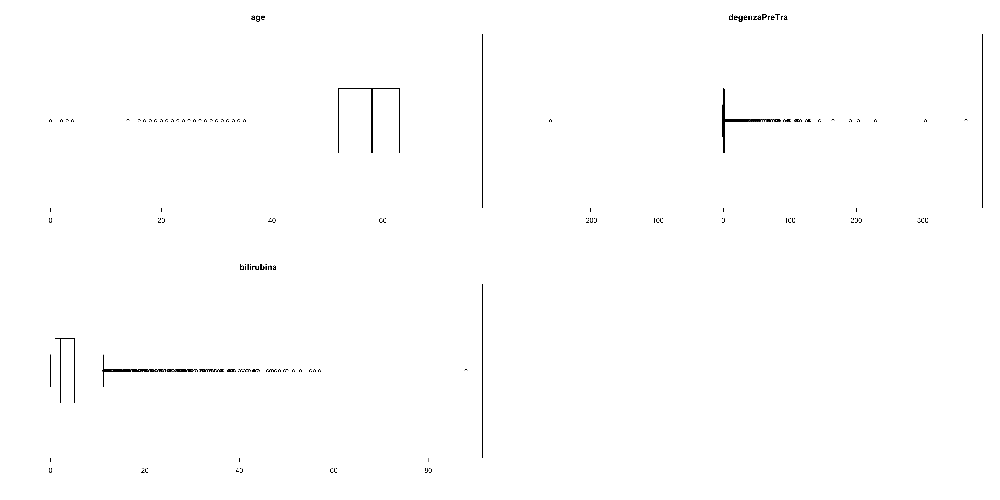

In [441]:
par(mfrow=c(2,2))

boxplot(df$age, horizontal = T, main="age")

boxplot(df$degenzaPreTra,horizontal = T,main="degenzaPreTra")


boxplot(df$bilirubinaTotale,horizontal = T, main="bilirubina")

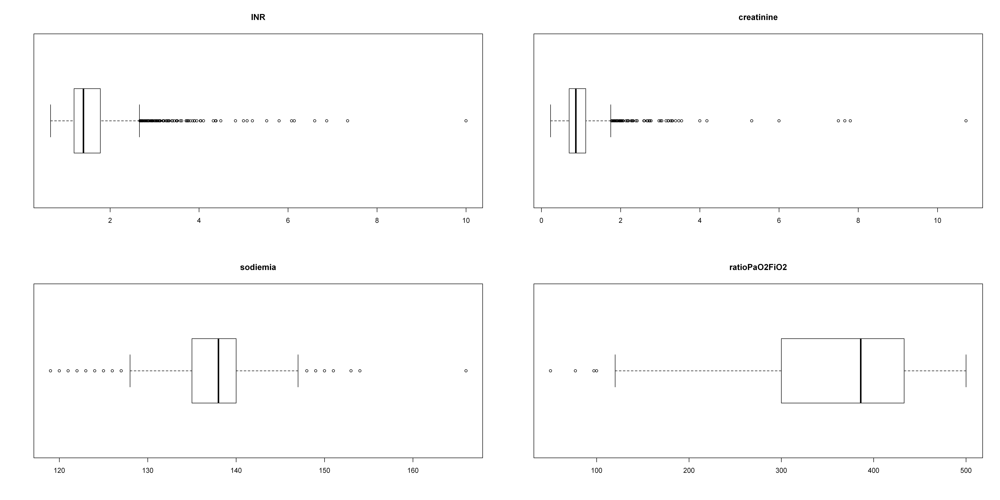

In [442]:
par(mfrow=c(2,2))

boxplot(df$INR,horizontal = T,main="INR")

boxplot(df$serumCreatinine,horizontal = T,main="creatinine")

boxplot(df$Sodiemia,horizontal = T,main="sodiemia")

boxplot(df$ratioPaO2FiO2,horizontal = T, main="ratioPaO2FiO2")

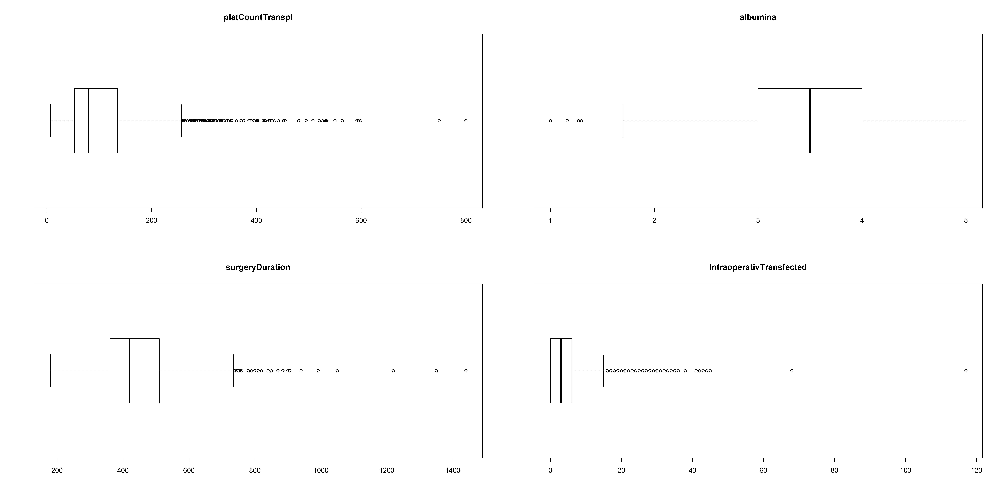

In [443]:
par(mfrow=c(2,2))

boxplot(df$platCountTranspl,horizontal = T,main="platCountTranspl")

boxplot(df$albumina,horizontal = T,main="albumina")

boxplot(df$surgeryDuration,horizontal = T,main="surgeryDuration")

boxplot(df$IntraoperativTransfected,horizontal = T, main="IntraoperativTransfected")

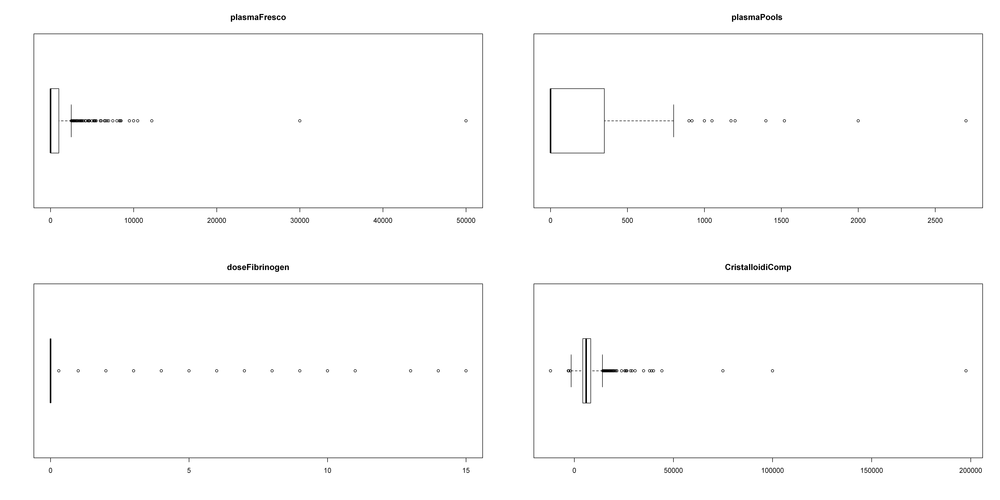

In [444]:
par(mfrow=c(2,2))

boxplot(df$plasmaFresco,horizontal = T,main="plasmaFresco")

boxplot(df$plasmaPools,horizontal = T,main="plasmaPools ")

boxplot(df$doseFibrinogen,horizontal = T,main="doseFibrinogen")

boxplot(df$CristalloidiComp,horizontal = T, main="CristalloidiComp")

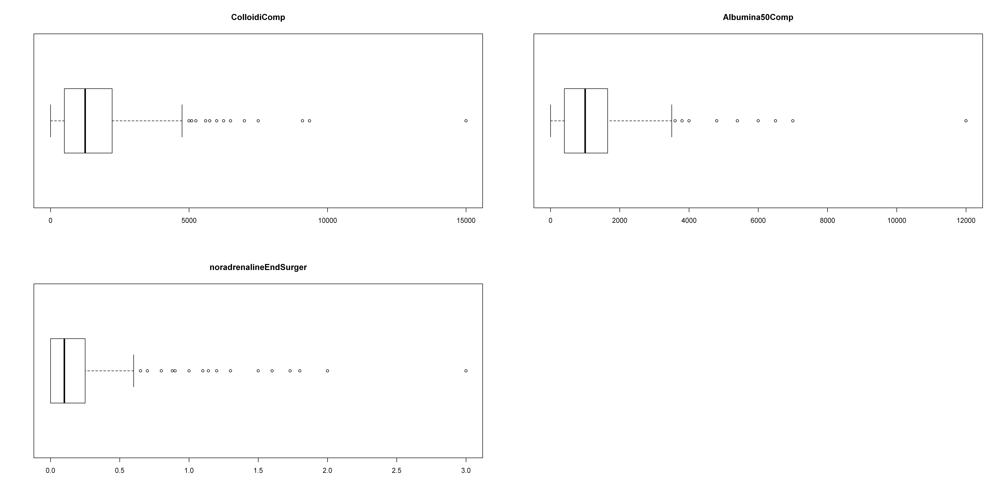

In [445]:
par(mfrow=c(2,2))

boxplot(df$ColloidiComp,horizontal = T,main="ColloidiComp")

boxplot(df$Albumina50Comp,horizontal = T,main="Albumina50Comp")


boxplot(df$noradrenalineEndSurger,horizontal = T, main="noradrenalineEndSurger")

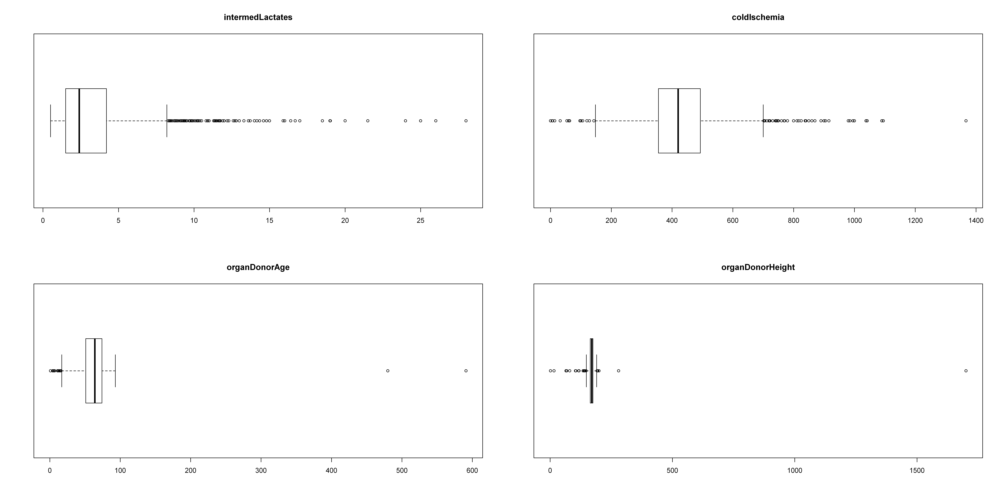

In [446]:
par(mfrow=c(2,2))

boxplot(df$intermedLactates,horizontal = T,main="intermedLactates")

boxplot(df$coldIschemia,horizontal = T,main="coldIschemia")

boxplot(df$organDonorAge,horizontal = T,main="organDonorAge")

boxplot(df$organDonorHeight,horizontal = T, main="organDonorHeight")

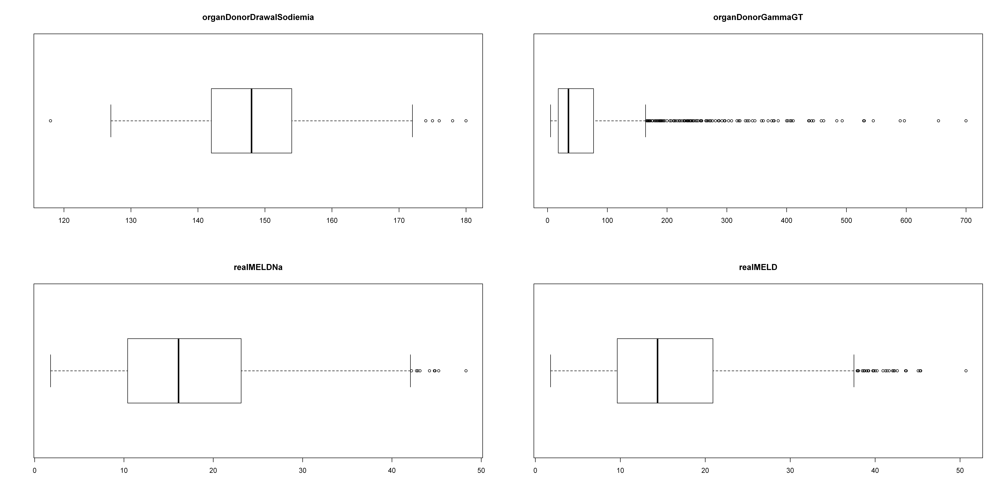

In [447]:
par(mfrow=c(2,2))

boxplot(df$organDonorDrawalSodiemia,horizontal = T,main="organDonorDrawalSodiemia")

boxplot(df$organDonorGammaGT,horizontal = T,main="organDonorGammaGT")

boxplot(df$realMELDNa,horizontal = T,main="realMELDNa")

boxplot(df$realMELD, horizontal = T,main="realMELD")

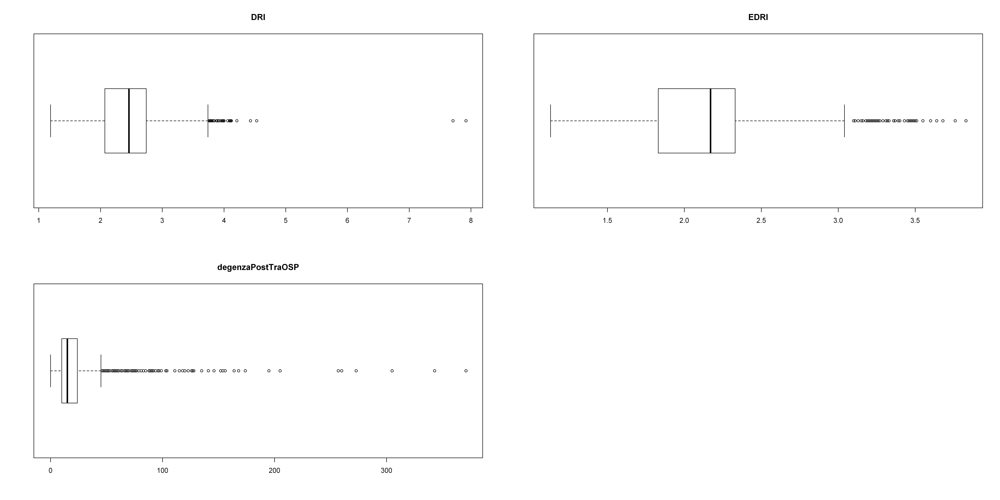

In [23]:
par(mfrow=c(2,2))

boxplot(df$DRI,horizontal = T,main="DRI")

boxplot(df$EDRI,horizontal = T,main="EDRI")

boxplot(df$degenzaPostTraOSP,horizontal = T,main="degenzaPostTraOSP")

Panoramica descrittiva su variabili categoriche con barplot

3 columns ignored with more than 50 categories.
patientKey: 1883 categories
icuAdmDate__icuAdmDate: 1132 categories
icuAdmDate__icuAdmTime: 616 categories




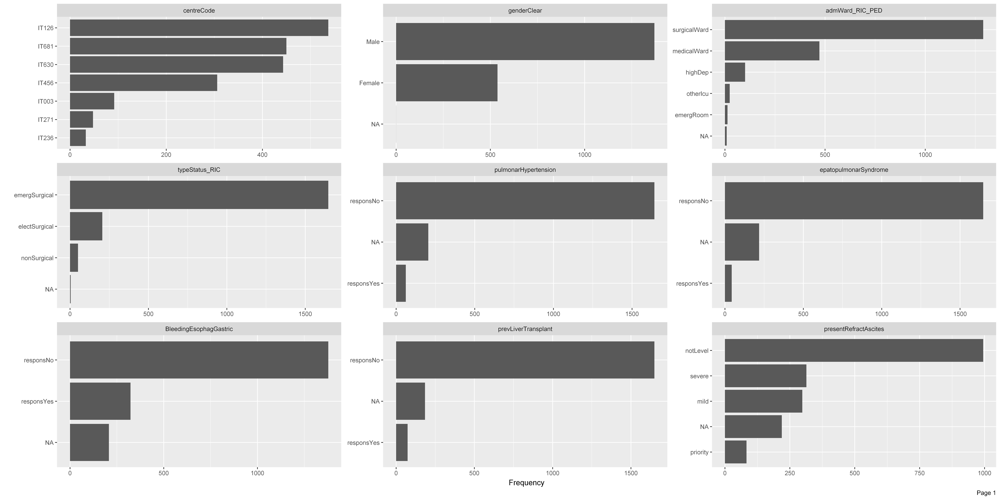

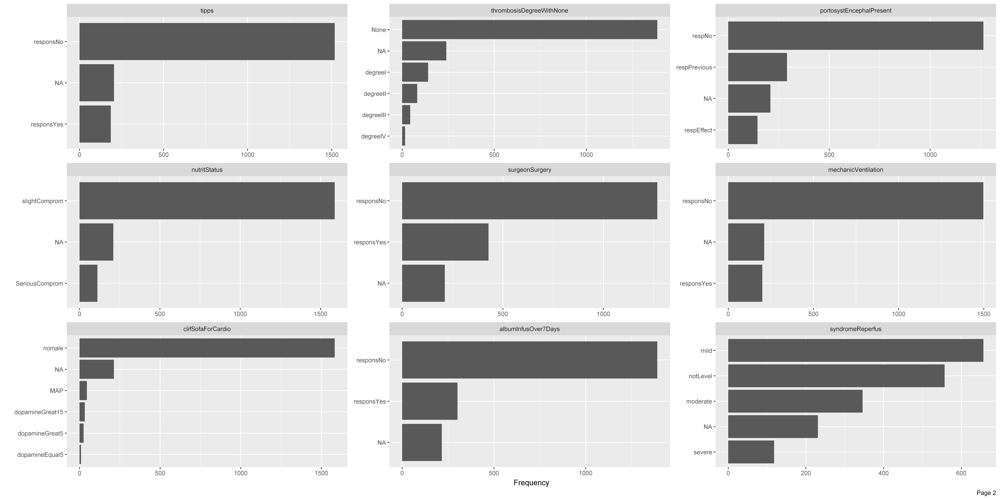

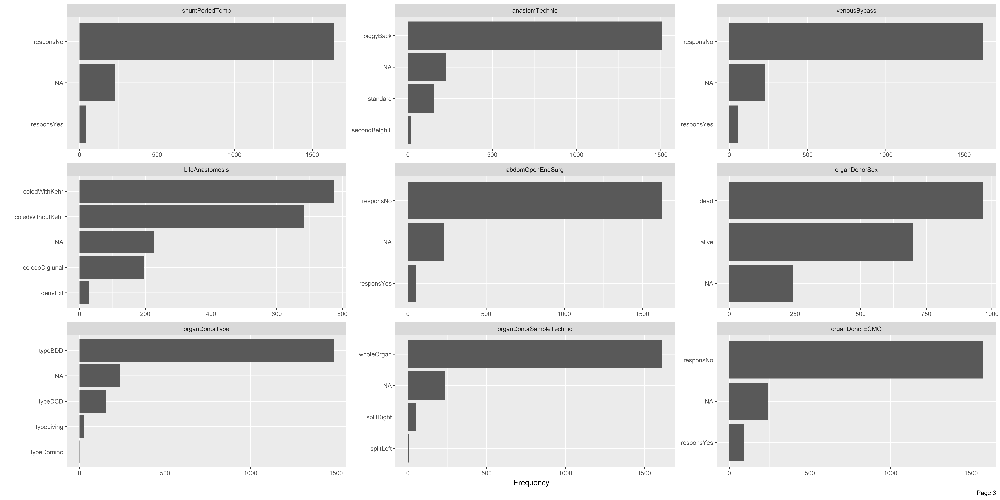

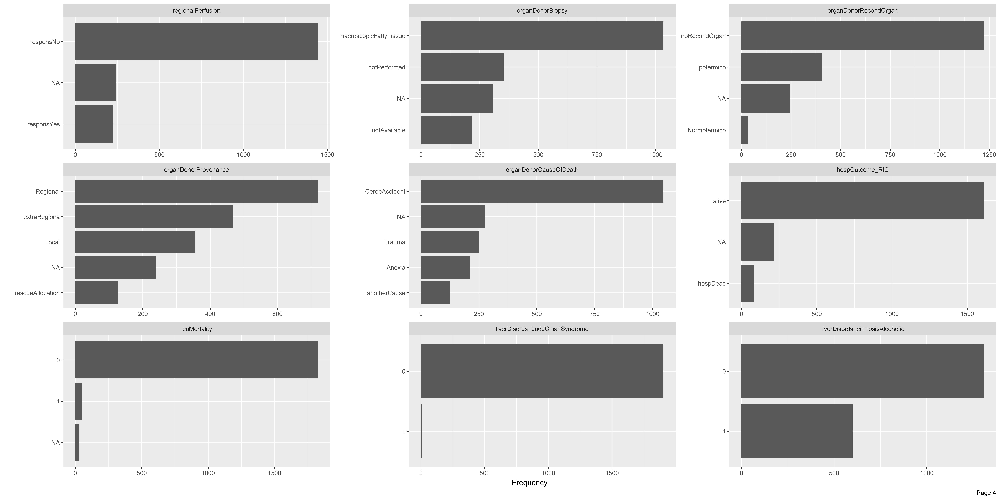

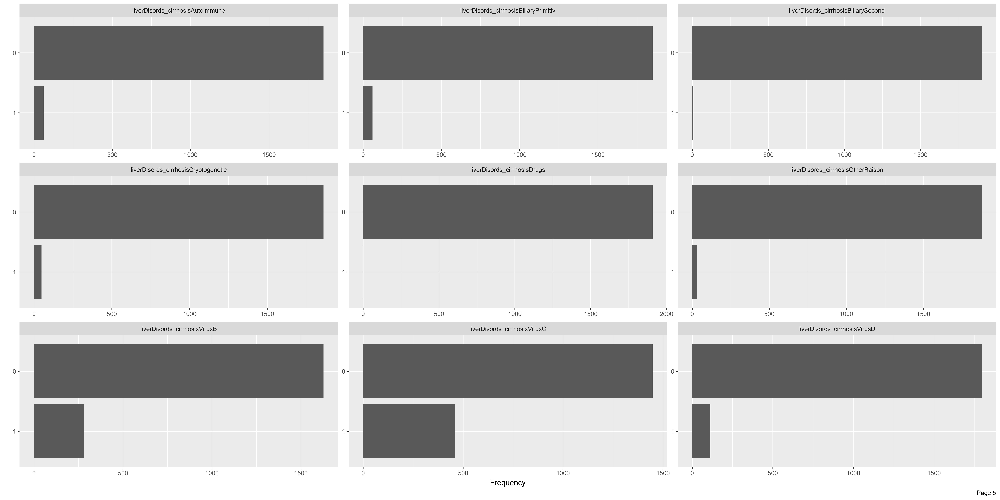

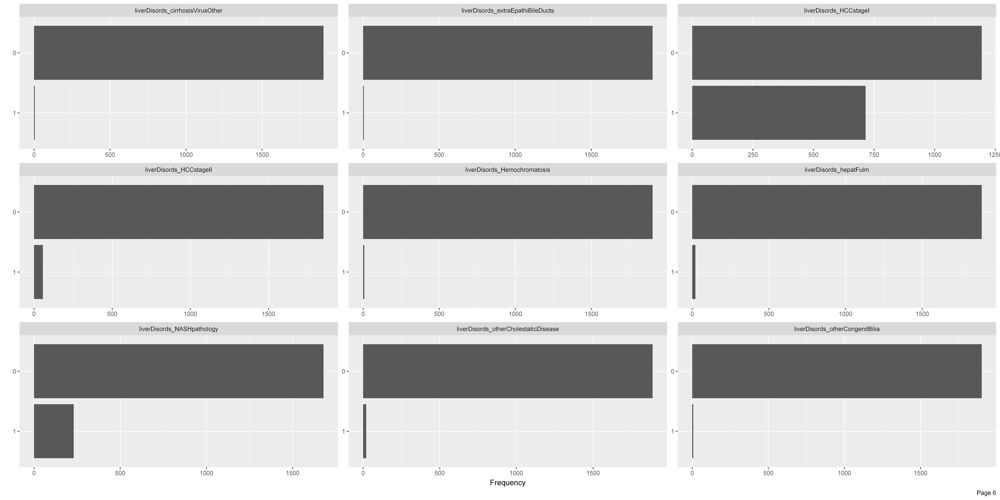

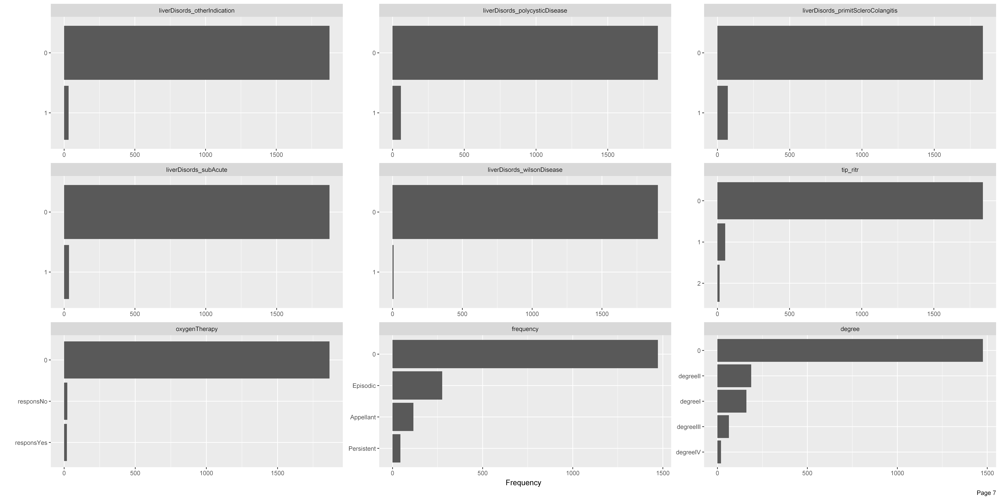

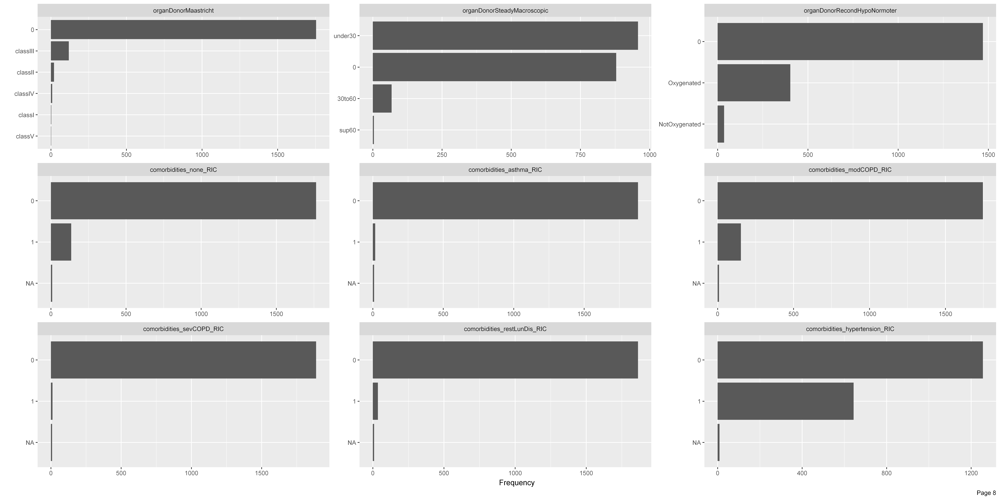

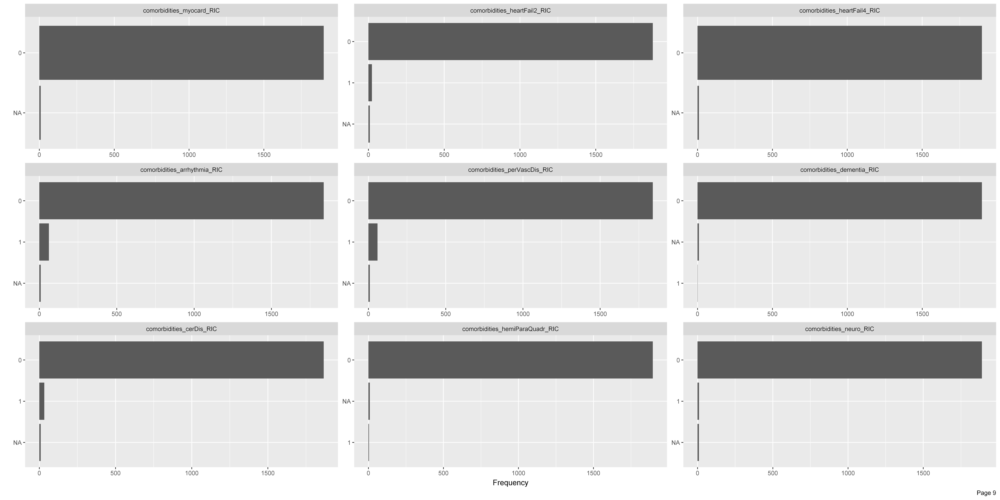

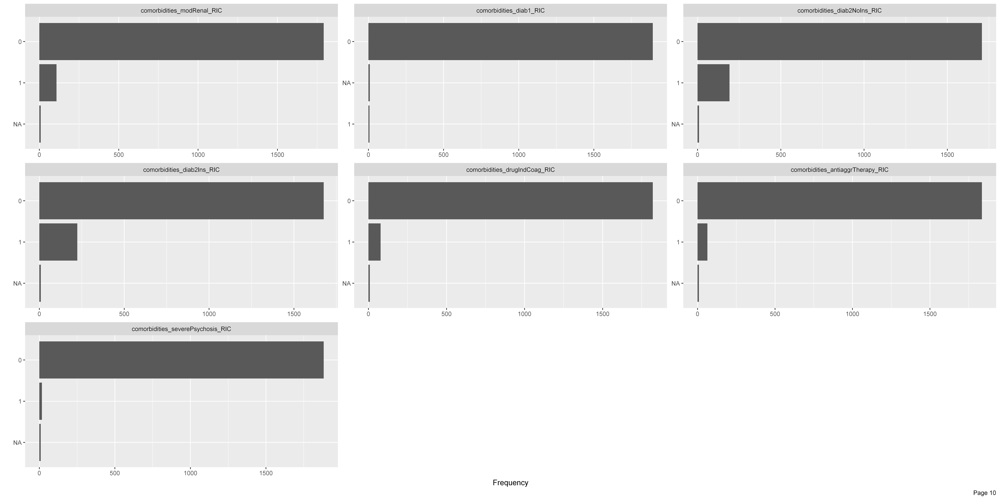

In [448]:
plot_bar(data = df)

Panoramica descrittiva su variabili continue fatta con istogrammi

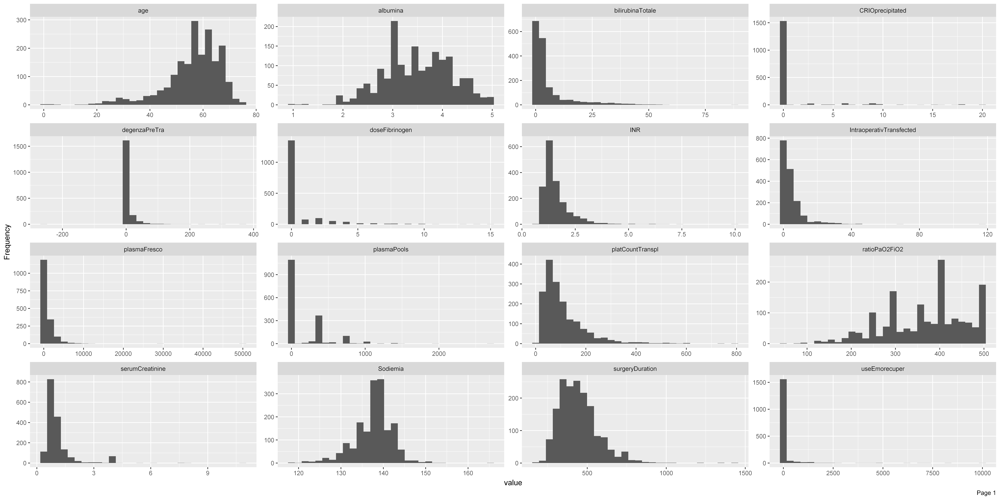

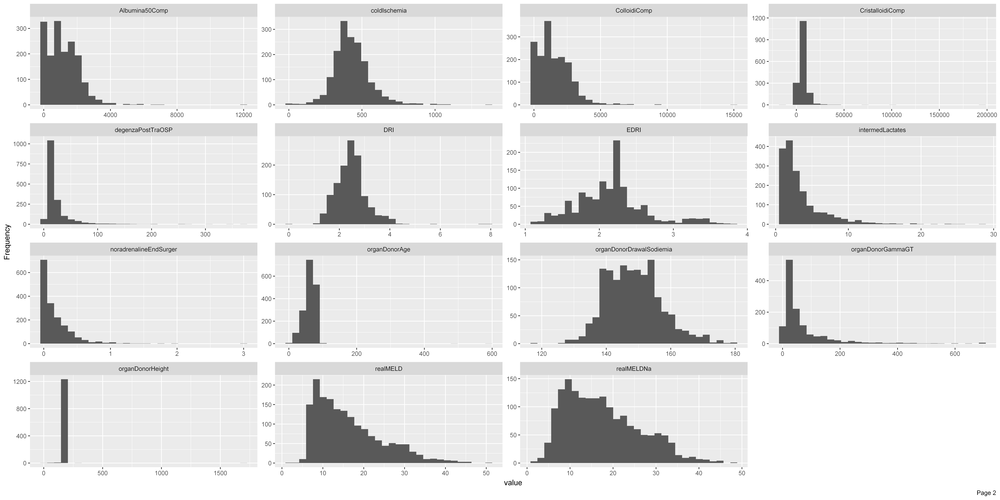

In [449]:
plot_histogram(data = df)

Controllo quanto sono schiacciate le variabili continue.
Se il coefficiente è maggiore di 0 allora la maggior parte dei valori sono inferiori alla media. La maggior parte dei valori si concentra quindi sul lato sinistro del grafico.
Se il coefficiente è uguale a 0 o vicino a 0, allora il grafico è simmetrico e i dati sono distribuiti normalmente.
Se il coefficiente è inferiore a 0, la maggior parte dei valori sono maggiori della media e la maggior parte dei valori si concentra sul lato destro del grafico.

In [450]:
apply(select_if(df,is.numeric), 2, skewness, na.rm = TRUE)

age            degenzaPreTra         bilirubinaTotale 
              -1.4388627                6.0353328                3.0052686 
                     INR          serumCreatinine                 Sodiemia 
               3.5978127                3.9870606               -0.4876286 
           ratioPaO2FiO2         platCountTranspl                 albumina 
              -0.4351739                2.4676410               -0.1281222 
         surgeryDuration IntraoperativTransfected             plasmaFresco 
               1.4218714                4.9591381               12.4274077 
             plasmaPools           doseFibrinogen         CRIOprecipitated 
               2.2104990                3.7255958                4.5878187 
           useEmorecuper         CristalloidiComp             ColloidiComp 
              10.0268116               15.2924662                1.9435809 
          Albumina50Comp   noradrenalineEndSurger         intermedLactates 
               1.8119964                3.7824236                2.6288253 
            coldIschemia            organDonorAge         organDonorHeight 
               1.0354405                9.8165560               30.8032948 
organDonorDrawalSodiemia        organDonorGammaGT                 realMELD 
               0.4392287                3.3120405                0.9935241 
              realMELDNa                      DRI                     EDRI 
               0.6500216                1.4788309                0.6563151 
       degenzaPostTraOSP 
               5.4220054

Viene vista nel dettaglio la variabile oggetto di studio, sia normalmente che attraverso una cumulativa

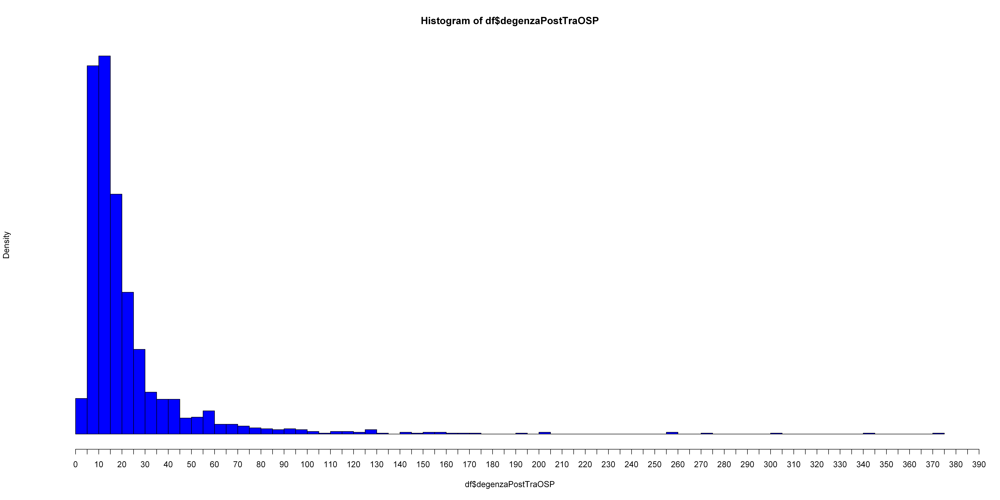

In [462]:
hist(df$degenzaPostTraOSP, freq = FALSE, axes= FALSE, breaks= 100,col="blue")

axis(1, at = seq(0, 400, by = 5))


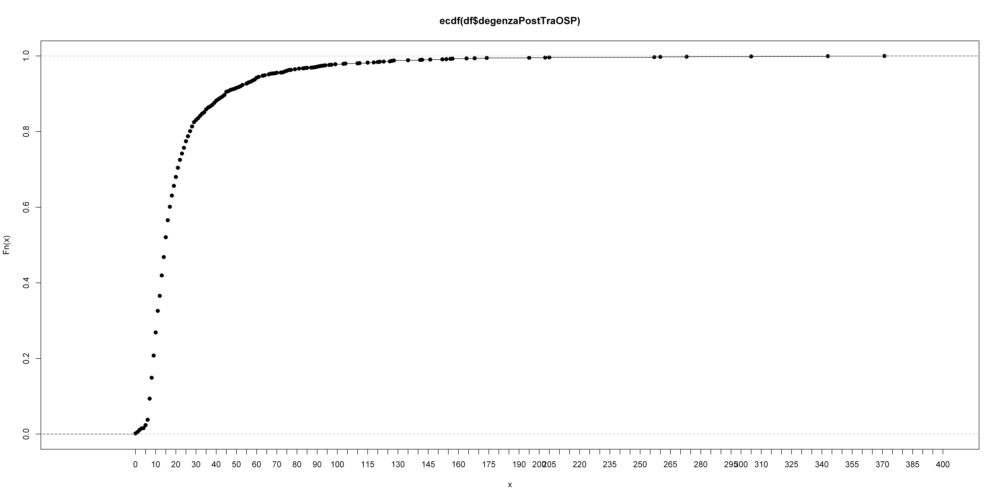

In [463]:
# calculate CDF 
CDF <- ecdf(df$degenzaPostTraOSP )
  
# draw the cdf plot
plot( CDF )
axis(1, at = seq(0, 400, by = 5))

Creazione di un dataframe temporaneo contenente solo le variabili numeriche per la creazione di un’heatmap che descrive la correlazione tra le variabili, escludendo la variabile oggetto. 

In [464]:
df_num <- select(df,is.numeric)

In [465]:
for(i in 1:ncol(df_num)) {
  df_num[ , i][is.na(df_num[ , i])] <- mean(df_num[ , i], na.rm = TRUE)
}

In [466]:
tmp <- cor(df_num) %>%
  as.data.frame() %>%
  mutate(var1 = rownames(.)) %>%
  gather(var2, value, -var1) %>%
  arrange(desc(value)) 

tmp <- tmp[tmp$value != 1,]

In [467]:
tmp <- tmp[!duplicated(tmp$value), ]

In [468]:
df_num <- subset(df_num,select = tmp[1:40,"var1"][!duplicated(tmp[1:40,"var1"])])

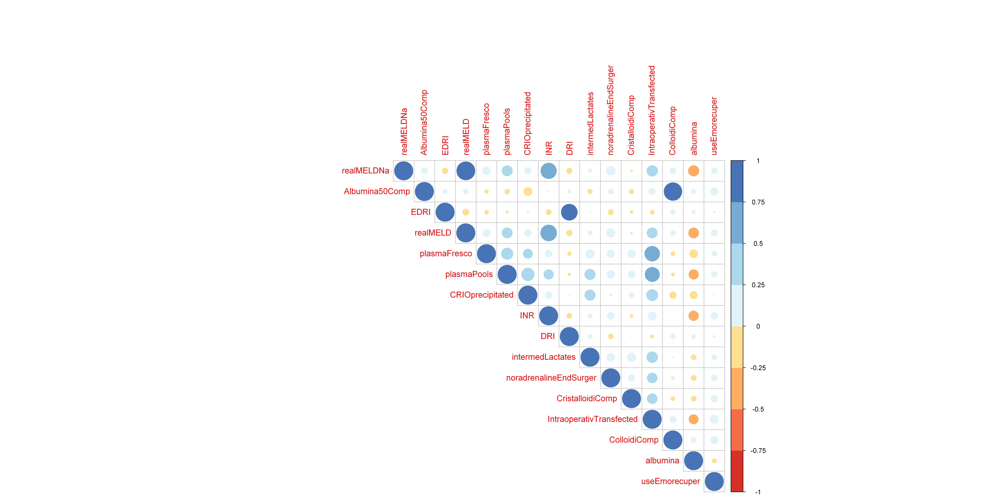

In [469]:


library(corrplot)
library(RColorBrewer)

M <-cor(df_num %>% 
          select(colnames(df_num)))

corrplot(M, type="upper", order = "original",col=brewer.pal(n=8, name="RdYlBu"))



Resoconto per variabili altamente correlate o inversamente correlate, nel primo caso vengono considerate le variabili con un coefficiente di correlazione maggiore di 0.5 mentre nel secondo minore di -0.5

In [470]:
tmp <- tmp[tmp$value> 0.5 | tmp$value < -0.5,]
tmp 

,var1,var2,value
32,realMELDNa,realMELD,0.9607767
34,Albumina50Comp,ColloidiComp,0.9208844
36,EDRI,DRI,0.7585111
38,realMELD,INR,0.7498024
40,realMELD,bilirubinaTotale,0.7282362
42,realMELDNa,INR,0.7088820
44,realMELDNa,bilirubinaTotale,0.6958163
46,plasmaFresco,IntraoperativTransfected,0.6512486
48,plasmaPools,IntraoperativTransfected,0.6047770


Uso dataframe con variabili numeriche per vedere la correlazione tra tutte le variabili e la variabile oggetto, l’ordine delle variabili è da quella con il coefficiente più alto a quella con il coefficiente più basso

In [471]:
#correlations with objective variable

df_num <- select(df, is.numeric)

data_cor <- cor(df_num[ , colnames(df_num) != "degenzaPostTraOSP"],
                df_num$degenzaPostTraOSP, use = "complete.obs")

data_cor <- data_cor[order(data_cor[,1],decreasing=TRUE),]                                     

data_cor <- as.data.frame(data_cor)

data_cor

,data_cor
realMELD,0.258187526
serumCreatinine,0.247212358
realMELDNa,0.247090285
bilirubinaTotale,0.154963208
plasmaPools,0.152598504
noradrenalineEndSurger,0.151442793
IntraoperativTransfected,0.146345004
degenzaPreTra,0.142966122
surgeryDuration,0.140027127
INR,0.135849643


Viene effettuato un plot che rappresenta i missing value per ogni variabile presente nel dataset, se la variabile non è presente allora i missing value sono pari a 0

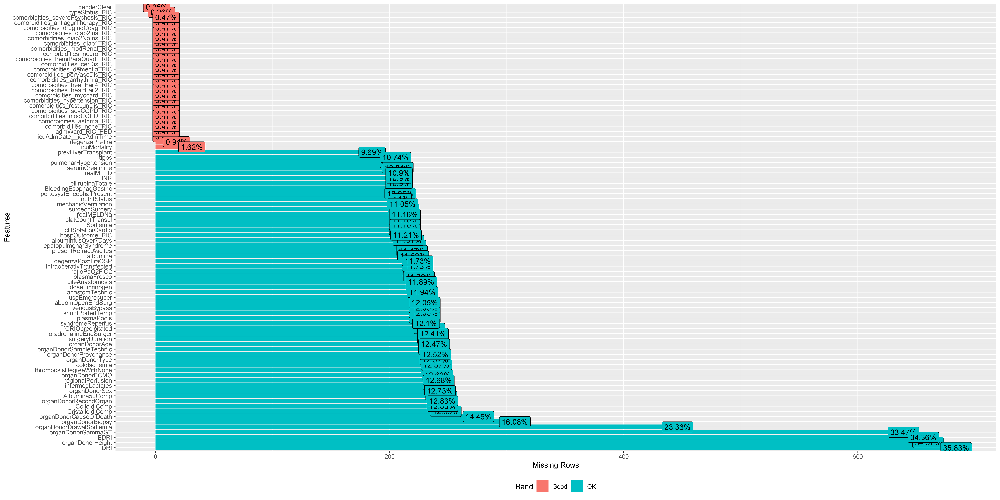

In [472]:
plot_missing(data = df,missing_only = TRUE)



In [473]:
#INFO

In [474]:
dim(df[df$age < 18,]) # minori di 18 anni

[1]   8 122

In [475]:
# numero piazienti trapianti combinati

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2018/tabellaUM_OT.Rdata")

OT1 <- tabellaUM_OT
rm(tabellaUM_OT)


patients_rem <- c()


patients1 <- OT1[ OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT1_rem <- OT1[!OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients1){
    if (i %in% OT1_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}



load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2019/tabellaUM_OT.Rdata")

OT2 <- tabellaUM_OT
rm(tabellaUM_OT)


patients2 <- OT2[ OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT2_rem <- OT2[!OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients2){
    if (i %in% OT2_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2020/tabellaUM_OT.Rdata")

OT3 <- tabellaUM_OT
rm(tabellaUM_OT)

patients3 <- OT3[ OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT3_rem <- OT3[!OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients3){
    if (i %in% OT3_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2021/tabellaUM_OT.Rdata")

OT4 <- tabellaUM_OT
rm(tabellaUM_OT)

patients4 <- OT4[ OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT4_rem <- OT4[!OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients4){
    if (i %in% OT4_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


dim((df[(df$patientKey %in% patients_rem),]))

[1]  43 122

In [476]:
dim(df[(df$liverDisords_hepatFulm %in% 1)
          | (df$liverDisords_subAcute %in% 1) ,]) # fulminanti, epatite acute

[1]  56 122

In [477]:
dim(df) #popolazione iniziale

[1] 1909  122

In [478]:
# ritrapianti in degenza: informazione mancante

In [479]:
#RECAP INFO:

# minori di 18 anni = 4

# numero piazienti trapianti combinati = 40

# fulminanti, epatite acute = 47

# popolazione iniziale = 1390

# ritrapianti in degenza: informazione mancante

In [480]:
dim(df)

[1] 1909  122

# Data preparation

Nella fase di data preparation per prima cosa vengono eliminati i record in cui non è presente un valore per la variabile oggetto

In [481]:
df <- df[!is.na(df$degenzaPostTraOSP),] # delete records with NA value in objective variable

Vengono eliminati i record che presentano epatite fulminante e cirrosi epatica acuta in quanto essi presentano caratteristiche molto diverse dal resto della popolazione analizzata

In [482]:
df <- df[!(df$liverDisords_hepatFulm %in% 1)
          & !(df$liverDisords_subAcute %in% 1) ,]   # deleting retransplant, fulminant hepatitis, acute liver failure

df <- subset(df, select= -c(liverDisords_hepatFulm,liverDisords_subAcute,prevLiverTransplant))

Vengono eliminati anche i pazienti che presentano più trapianti durante la stessa degenza per gli stessi motivi di prima

In [483]:
# deleting combined transplant patients

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2018/tabellaUM_OT.Rdata")

OT1 <- tabellaUM_OT
rm(tabellaUM_OT)


patients_rem <- c()


patients1 <- OT1[ OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT1_rem <- OT1[!OT1$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients1){
    if (i %in% OT1_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}



load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2019/tabellaUM_OT.Rdata")

OT2 <- tabellaUM_OT
rm(tabellaUM_OT)


patients2 <- OT2[ OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT2_rem <- OT2[!OT2$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients2){
    if (i %in% OT2_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2020/tabellaUM_OT.Rdata")

OT3 <- tabellaUM_OT
rm(tabellaUM_OT)

patients3 <- OT3[ OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT3_rem <- OT3[!OT3$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients3){
    if (i %in% OT3_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}

load(file = "X:/datasetsProsafe/LIVERTRASPLANT/2021/tabellaUM_OT.Rdata")

OT4 <- tabellaUM_OT
rm(tabellaUM_OT)

patients4 <- OT4[ OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,
               c('patientKey')]


OT4_rem <- OT4[!OT4$procOrgantransDetail__Id %in% "procOrgantransDetail_liverTransp" ,]

for (i in patients4){
    if (i %in% OT4_rem[,"patientKey"]){
        patients_rem <- append( patients_rem ,i)
    }
}


df <- (df[!(df$patientKey %in% patients_rem),])



Sistemo variabile per la quale sono presenti 8 valori negativi generati probabilmente per errore, la formula con cui ho creato in precedenza la variabile CristalloidiComp utilizzata anche nei report dovrebbe essere corretta sentendo anche il parere di Skurzak.

In [484]:
df <- df[df$CristalloidiComp >= 0,] 

creo epoche storiche di 6 mesi utilizzando la variabile riguardante la data per tenere conto dei cambiamenti nelle pratiche cliniche e organizzative durante i periodi considerati

In [485]:
df <-  df %>%  
  mutate(Periodi_trap = case_when(
    icuAdmDate__icuAdmDate > "2018-01-01" & icuAdmDate__icuAdmDate <= "2018-12-31" ~ 1,
    icuAdmDate__icuAdmDate >= "2019-01-01" & icuAdmDate__icuAdmDate < "2019-06-30" ~ 2,
    icuAdmDate__icuAdmDate >= "2019-06-30" & icuAdmDate__icuAdmDate <= "2019-12-31" ~ 3,
    icuAdmDate__icuAdmDate >= "2020-01-01" & icuAdmDate__icuAdmDate < "2020-06-30" ~ 4,
    icuAdmDate__icuAdmDate >= "2020-06-30" & icuAdmDate__icuAdmDate <= "2020-12-31" ~ 5,
    icuAdmDate__icuAdmDate >= "2021-01-01" & icuAdmDate__icuAdmDate < "2021-06-30" ~ 6,
    icuAdmDate__icuAdmDate >= "2021-06-30" & icuAdmDate__icuAdmDate <= "2021-12-31" ~ 7,
    icuAdmDate__icuAdmDate >= "2022-01-01" & icuAdmDate__icuAdmDate < "2022-08-30" ~ 8))

df$Periodi_trap <- as.factor(df$Periodi_trap)

df <- subset(df, select = -icuAdmDate__icuAdmDate)

Creo variabile binaria con l’utilizzo dell’orario dell’ammissione in terapia intensiva. Questa variabile indica se il trapianto è stato effettuato di notte o no. Per notte è considerato il periodo mezzanotte 11 mentre per giorno il resto

In [486]:
df$trap_notturno <- ifelse( df$icuAdmDate__icuAdmTime <= 11 & df$icuAdmDate__icuAdmTime >= 0, 1 , 0)

df$trap_notturno <- as.factor(df$trap_notturno)

df <- subset(df, select = -icuAdmDate__icuAdmTime)

Con i consigli di Skurzak ho creato una nuova variabile per quanto riguarda il reparto di provenienza andando ad eliminare la vecchia variabile

In [487]:
df <- df %>%  
  mutate(new_admWard = case_when(      
      degenzaPreTra <= 1 ~ "HOME",
      degenzaPreTra > 1 & (admWard_RIC_PED == "medicalWard" | admWard_RIC_PED == "surgicalWard") ~ "WARD",
      degenzaPreTra > 1 & (admWard_RIC_PED == "otherIcu" | admWard_RIC_PED == "emergRoom" | admWard_RIC_PED == "highDep") ~ "ICU"))


df$new_admWard <- as.factor(df$new_admWard)

df <- subset(df, select = -admWard_RIC_PED)

Creazione di altra variabile andando a combinare portosystEncephalPresent, frequency e degree sempre su suggerimento da parte di Skurzak

In [488]:
df <-  df %>% 
  mutate(EPScum = case_when(portosystEncephalPresent == "respNo" ~ 0,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Episodic" & (degree == "degreeI" |degree == "degreeII"))~ 1,
                            (portosystEncephalPresent == "respEffect" & frequency == "Episodic" & (degree == "degreeI" |degree == "degreeII"))~ 2,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Episodic" & (degree == "degreeIII" |degree == "degreeIV"))~ 3,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Appellant" & (degree == "degreeI" |degree == "degreeII"))~ 4,
                            (portosystEncephalPresent == "respEffect" & frequency == "Persistent" & (degree == "degreeI" |degree == "degreeII"))~ 5,
                            (portosystEncephalPresent == "respPrevious" & frequency == "Appellant" & (degree == "degreeIII" |degree == "degreeIV"))~ 6,
                            (portosystEncephalPresent == "respEffect" & frequency == "Episodic" & (degree == "degreeIII" |degree == "degreeIV"))~ 7,
                            (portosystEncephalPresent == "respEffect" & frequency == "Persistent" & (degree == "degreeIII" |degree == "degreeIV"))~ 8))

df <- subset(df, select = - c(portosystEncephalPresent,frequency,degree))

df$EPScum <- as.factor(df$EPScum)

Anche qui modifica alla variabile organDonorMaastricht sempre seguendo i consigli dati da Skurzak

In [489]:
df$organDonorMaastricht <- ifelse( df$organDonorMaastricht == "classI" | df$organDonorMaastricht == "classIV"
                                        | df$organDonorMaastricht == "classV", "class_other" , df$organDonorMaastricht)

df$organDonorMaastricht <- as.factor(df$organDonorMaastricht)

Viene fatto raggruppamento variabili che riguardano le tipologie epatiche. Il raggruppamento viene fatto perchè le variabili a scelta multipla che hanno una bassissima varianza quindi diminuendo il livello di dettaglio si rende la variabile più utile per la fase successiva. Le categorie create sono: colestatiche, rare, virali e tumore

In [490]:
# colestatiche




df <-  df %>% 
  mutate(colestatiche = case_when(liverDisords_cirrhosisBiliaryPrimitiv==1|liverDisords_cirrhosisBiliarySecond==1|
                                  liverDisords_primitScleroColangitis==1|
          liverDisords_extraEpathiBileDucts==1|liverDisords_otherCongenitBilia==1|
                                  liverDisords_otherCholestaticDisease==1~ 1,
                                  TRUE~ 0))

df$colestatiche <- as.factor(df$colestatiche)

df <- subset(df, select= - c(liverDisords_cirrhosisBiliaryPrimitiv,liverDisords_cirrhosisBiliarySecond,
                             liverDisords_primitScleroColangitis,liverDisords_extraEpathiBileDucts,
                            liverDisords_otherCongenitBilia, liverDisords_otherCholestaticDisease))



#rare

df <-  df %>% 
  mutate(rare = case_when(liverDisords_Hemochromatosis == 1|liverDisords_cirrhosisCryptogenetic == 1|
    liverDisords_cirrhosisOtherRaison == 1|liverDisords_otherIndication == 1|liverDisords_wilsonDisease == 1|
    liverDisords_cirrhosisDrugs == 1| liverDisords_buddChiariSyndrome == 1 | 
                          liverDisords_polycysticDisease == 1 | liverDisords_cirrhosisAutoimmune == 1 ~ 1,
                          TRUE ~ 0))

df$rare <- as.factor(df$rare)

df <- subset(df, select= - c(liverDisords_Hemochromatosis,liverDisords_cirrhosisCryptogenetic,
                             liverDisords_cirrhosisOtherRaison,liverDisords_otherIndication,liverDisords_wilsonDisease,
                            liverDisords_buddChiariSyndrome,liverDisords_polycysticDisease,liverDisords_cirrhosisAutoimmune))


#virali

df <-  df %>% 
  mutate(virali = case_when(liverDisords_cirrhosisVirusC == 1|liverDisords_cirrhosisVirusB == 1|
                            liverDisords_cirrhosisVirusD == 1|
                            liverDisords_cirrhosisVirusOther == 1 ~ 1,
                            TRUE ~ 0))

df$virali <- as.factor(df$virali)

df <- subset(df, select= - c(liverDisords_cirrhosisVirusC,liverDisords_cirrhosisVirusB,
                             liverDisords_cirrhosisVirusD,liverDisords_cirrhosisVirusOther))



#tumore

df <-  df %>% 
  mutate(tumore = case_when(liverDisords_HCCstageI == 1 | liverDisords_HCCstageII == 1 ~ 1,                 
                            TRUE ~ 0))

df$tumore <- as.factor(df$tumore)

df <- subset(df, select= - c(liverDisords_HCCstageI,liverDisords_HCCstageII))

Stessa cosa viene fatta con le comorbidità. Qui le categorie create sono: respiratorie, cardiovascolari, neurologiche, renali, endocrine e scoagulazione. Sia in questo caso che in quello precedente con le patologie epatiche vengono poi eliminate le variabili che compongono i vari gruppi e viene resa factor la variabile appena creata.

In [491]:
#respiratorie

df <- df %>% 
    mutate(comorbidities_respiratorie = ifelse( comorbidities_asthma_RIC == 1 | comorbidities_modCOPD_RIC == 1 |
                                               comorbidities_sevCOPD_RIC == 1 | comorbidities_restLunDis_RIC == 1 |
                                               oxygenTherapy == "responsYes", 1, 0))

df$comorbidities_respiratorie <- as.factor(df$comorbidities_respiratorie)
df <- subset(df, select = -c(comorbidities_asthma_RIC,comorbidities_modCOPD_RIC, comorbidities_sevCOPD_RIC, 
                             comorbidities_restLunDis_RIC, oxygenTherapy ))






#cardiovascolari

df <- df %>% 
    mutate(comorbidities_cardiovascolari = ifelse( comorbidities_myocard_RIC == 1 | comorbidities_heartFail2_RIC == 1 |
                                               comorbidities_heartFail4_RIC == 1 | comorbidities_arrhythmia_RIC == 1 |
                                               comorbidities_perVascDis_RIC == 1, 1, 0))

df$comorbidities_cardiovascolari <- as.factor(df$comorbidities_cardiovascolari)
df <- subset(df, select = -c(comorbidities_myocard_RIC,comorbidities_heartFail2_RIC, comorbidities_heartFail4_RIC, 
                             comorbidities_arrhythmia_RIC, comorbidities_perVascDis_RIC ))


#neurologiche

df <- df %>% 
    mutate(comorbidities_neurologiche = ifelse( comorbidities_dementia_RIC == 1 | comorbidities_cerDis_RIC == 1 |
                                               comorbidities_hemiParaQuadr_RIC == 1 | comorbidities_neuro_RIC == 1 , 1, 0))

df$comorbidities_neurologiche <- as.factor(df$comorbidities_neurologiche)
df <- subset(df, select = -c(comorbidities_dementia_RIC,comorbidities_cerDis_RIC, comorbidities_hemiParaQuadr_RIC, 
                             comorbidities_neuro_RIC))


#renali

df <- df %>% 
    mutate(comorbidities_renali = ifelse( comorbidities_modRenal_RIC == 1 | comorbidities_modRenal_RIC == 1, 1, 0))

df$comorbidities_renali <- as.factor(df$comorbidities_renali)
df <- subset(df, select = -c(comorbidities_modRenal_RIC,comorbidities_modRenal_RIC))


#endocrine

df <-  df %>% 
  mutate(comorbidities_diabete = case_when(comorbidities_diab2NoIns_RIC == 1 ~ 1,
  comorbidities_diab1_RIC == 0 & comorbidities_diab2Ins_RIC == 0 & comorbidities_diab2NoIns_RIC == 0 ~ 0,
  comorbidities_diab1_RIC == 1 |comorbidities_diab2Ins_RIC == 1 ~ 2))

df$comorbidities_diabete <- as.factor(df$comorbidities_diabete)
df <- subset(df, select= - c(comorbidities_diab1_RIC,comorbidities_diab2Ins_RIC,comorbidities_diab2NoIns_RIC))

#scoagulazione

df <- df %>% 
    mutate(comorbidities_scoagulazione = ifelse( comorbidities_drugIndCoag_RIC == 1 |
                                                comorbidities_antiaggrTherapy_RIC == 1 , 1, 0))

df$comorbidities_scoagulazione <- as.factor(df$comorbidities_scoagulazione)
df <- subset(df, select = -c(comorbidities_drugIndCoag_RIC,comorbidities_antiaggrTherapy_RIC))

Sempre seguendo le indicazioni di Skurzak viene creata una variabile binaria MELDEXCEPTION che è pari a 1 se è presente una tra ipertensione polmonare e sindrome epatopolmonare, altrimenti 0. Quest'utltime due variabili vengono eliminate

In [492]:
df <- df %>% 
    mutate(MELDEXCEPTION = ifelse( pulmonarHypertension == "responsYes" |
                                                epatopulmonarSyndrome == "responsYes" , 1, 0))

df$MELDEXCEPTION <- as.factor(df$MELDEXCEPTION)
df <- subset(df, select = -c(pulmonarHypertension,epatopulmonarSyndrome))

Viene modificata la variabile intraoperativeTransfected andando a dividere l’emorecupero per 350 e poi viene sommato il valore originale di intraoperativeTransfected, emorecuper viene infine eliminato

In [493]:
df <- df %>% mutate(IntraoperativTransfected = (useEmorecuper / 350) + IntraoperativTransfected )

df <- subset(df, select = -useEmorecuper)

Elimino la variabile patientKey in quanto priva di informazioni e rendo factor centreCode in modo da poterlo passare ai modelli dato che lo dava come character 

In [494]:
df <- subset(df, select = -patientKey)
df$centreCode <- as.factor(df$centreCode)

Viene aggiunta nella variabile oggetto (degenza ospedaliera post trapianto) una penalità nel caso in cui il paziente sia deceduto. Questa penalità è pari al 90esimo percentile (44 giorni)

In [495]:
tmp <- unname(unlist(quantile(df$degenzaPostTraOSP, probs = c(0.9), na.rm = TRUE)))
df <- df %>% mutate(degenzaPostTraOSP = case_when(hospOutcome_RIC  %in% "hospDead" ~ tmp,
                                                  icuMortality %in% 1 ~ tmp,
                                                  TRUE ~ degenzaPostTraOSP))  #add penalty in degenzaPostTraOSP for patients who died

Vado a discretizzare la variabile oggetto in modo da poter utilizzare i modelli di classificazione. La discretizzazione è stata decisa da Skurzak. Per il periodo 0-8 giorni è stata assegnata la classe ottimo, per degenze da 8 a 18 giorni la classe accettabile, infine degenze maggiori di 18 giorni complicato. Elimino le variabili riguardanti la mortalità in quanto non più utili per lo studio

In [496]:
df$deg_cat <- cut(df$degenzaPostTraOSP ,breaks=c(0,12,Inf)) # 0.33 percentile

df <- df %>% mutate(deg_cat = case_when(deg_cat == levels(df$deg_cat)[1] ~ "fast",     # discretize objective variable
                                      deg_cat == levels(df$deg_cat)[2] ~ "NotFast"))

df$deg_cat <- as.factor(df$deg_cat)

df <- subset(df, select = -c(hospOutcome_RIC,icuMortality))

In [497]:
table(df$deg_cat)


   fast NotFast 
    491     912 

Elimino EDRI, DRI, ColloidiComp, realMELD, Sodiemia, serumCreatinine, INR e bilirubinaTotale perchè sono le variabili fortemente correlate o dipendenti ad altre variabili che ho mantenuto. Ad esempio bilirubinaTotale, INR, serumCreatinine e Sodiemia sono variabili utilizzate nella formula per il calcolo del MELDNa.

In [498]:
df <- subset(df, select = - c(EDRI,DRI,ColloidiComp,realMELD,
                              serumCreatinine,INR,bilirubinaTotale,Sodiemia)) #delete high correlated variables and dependent variables

Rimuovo le righe >= 50% di missing value

In [499]:
dim(df[which(rowMeans(!is.na(df)) < 0.5), ]) #136

[1] 175  75

In [500]:
df <- df[which(rowMeans(!is.na(df)) >= 0.5), ]

Rimuovo le colonne che hanno più del 50% di missing value

In [501]:
df <- df[, which(colMeans(!is.na(df)) > 0.5)] #0

Plotto una descrittiva delle variabili modificate o appena create

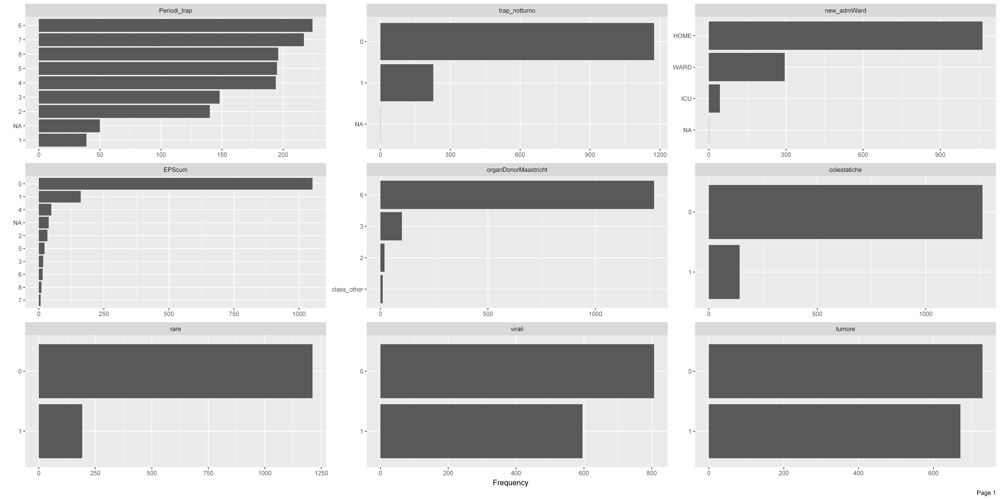

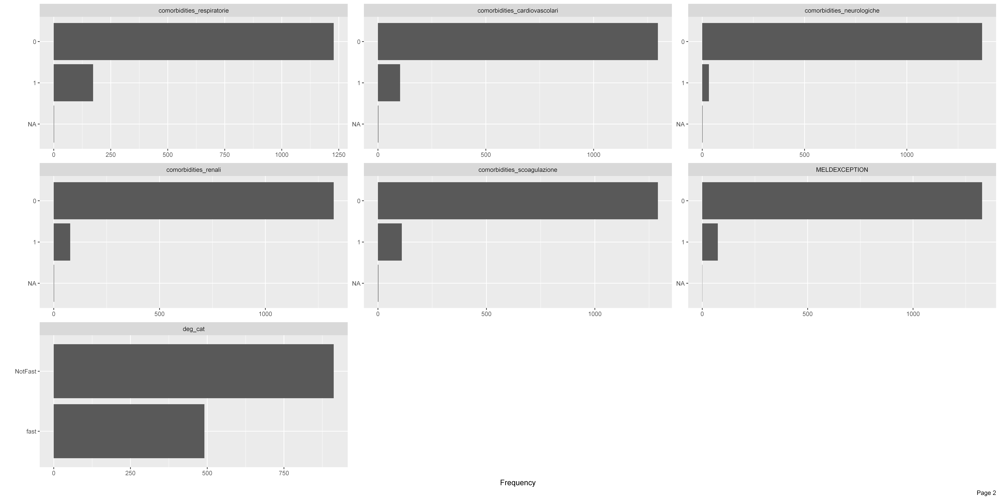

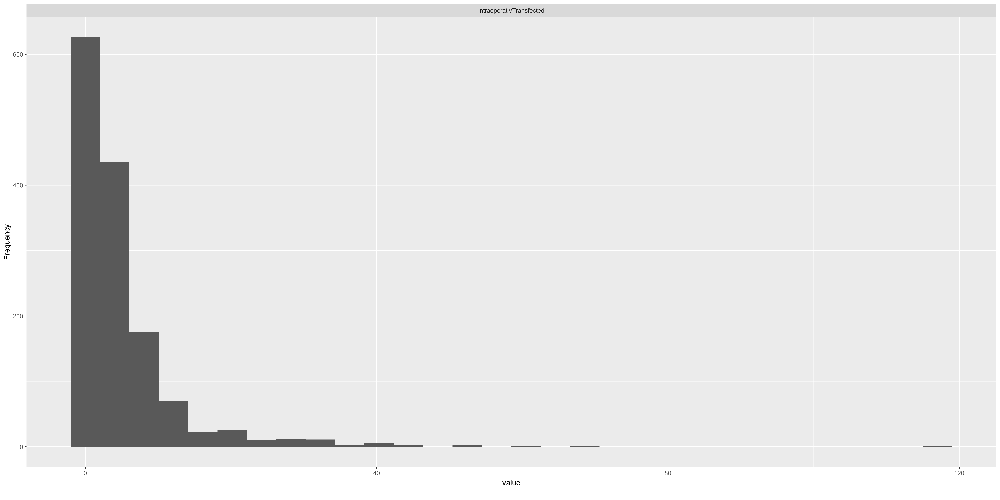

In [502]:
nuove_descrittiva <- subset(df, select= c(Periodi_trap,trap_notturno,new_admWard,EPScum,organDonorMaastricht,colestatiche,rare,virali,tumore,
comorbidities_respiratorie,comorbidities_cardiovascolari,comorbidities_neurologiche,comorbidities_renali,
comorbidities_scoagulazione,MELDEXCEPTION,deg_cat,IntraoperativTransfected))


plot_bar(data = nuove_descrittiva)

plot_histogram(data = nuove_descrittiva)

Numero totale per tipologia di variabile dopo la fase preparazione dati

In [503]:
aggregate(sapply(df,class), by=list(sapply(df,class)), FUN=length) # tipo variabili dopo data preparation

Group.1,x
factor,53
numeric,22


# Preprocessing

Vengono imputati i missing value tramite la funzione missforest. Questa funzione esegue l'imputazione dei dati utilizzando l'algoritmo random forest, il quale utilizza una serie di alberi decisionali per prevedere il valore mancante basandosi sui valori presenti nel dataset.

In [504]:
library(missForest)

df_imp <- missForest(df)       # fill NA

df <- df_imp$ximp

df_imp <- missForest(df)

df <- df_imp$ximp

In [505]:
df_score <- df

preProc <- preProcess(df_score, method = c("zv","corr"))

df_score_finale <- predict(preProc, df_score)

save(df_score_finale, file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_score_finale.Rdata")

In [506]:
save(df_score_finale, file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_score_finale.Rdata")

Attraverso la funzione preProcess applico 4 tipi di trasformazione dei dati: i primi due, ossia center e scale fanno in modo che venga applicata una standardizzazione dei dati, infatti attraverso center si va a sottrarre la media dei valori di ogni variabile dai valori di ogni osservazione di quella variabile e ciò consente di traslare i valori di ogni variabile in modo che la loro media sia zero.
Attraverso il metodo scale invece vengono divisi i valori di ogni osservazione di una variabile per la deviazione standard di quella variabile e ciò consente di rendere i valori di ogni variabile compresi nello stesso intervallo, in questo caso tra -1 ed 1. Questa standardizzazione è utile perché può aiutare a rendere i dati più adatti a certi tipi di modelli di classificazione, come ad esempio il K-nearest neighbors che basa la sua classificazione sulla distanza tra le osservazioni. La standardizzazione consente di rendere tutte le variabili sulla stessa scala, rendendo così la distanza più significativa. Con il metodo boxcox, invece produce una trasformazione ottimale per rendere i dati più simili a una distribuzione normale, andando quindi a sistemare le variabili altamente schiacciate identificate nella fase di esplorazione dei dati. Infine con la funzione zv si vanno ad eliminare tutte le variabili che hanno varianza pari a 0 quindi prive di informazioni. Su questo ultimo punto si potrebbe usare anche il metodo nzv nel quale si indica un threshold per la varianza sotto la quale le variabili vengono eliminate

In [507]:
head(df_score_finale)

,centreCode,genderClear,age,degenzaPreTra,typeStatus_RIC,BleedingEsophagGastric,presentRefractAscites,tipps,thrombosisDegreeWithNone,nutritStatus,...,virali,tumore,comorbidities_respiratorie,comorbidities_cardiovascolari,comorbidities_neurologiche,comorbidities_renali,comorbidities_diabete,comorbidities_scoagulazione,MELDEXCEPTION,deg_cat
15,IT126,Male,48,1,emergSurgical,responsNo,notLevel,responsNo,None,slightComprom,...,1,1,0,0,0,0,0,0,0,fast
16,IT126,Male,19,42,emergSurgical,responsYes,notLevel,responsNo,None,SeriousComprom,...,0,0,0,0,0,0,0,0,0,NotFast
29,IT126,Male,67,9,emergSurgical,responsNo,notLevel,responsNo,None,slightComprom,...,1,1,0,1,0,0,0,0,0,fast
30,IT126,Male,54,3,emergSurgical,responsNo,severe,responsNo,None,SeriousComprom,...,0,0,0,0,0,0,0,0,0,NotFast
32,IT126,Male,59,1,emergSurgical,responsNo,notLevel,responsNo,None,slightComprom,...,1,1,0,0,0,0,0,0,0,fast
33,IT126,Female,69,0,emergSurgical,responsNo,notLevel,responsNo,None,slightComprom,...,0,1,0,0,0,0,1,0,0,fast


In [508]:
tmp <- df$degenzaPostTraOSP
df <- subset(df,select= -degenzaPostTraOSP)


preProc <- preProcess(df, method = c("center","scale","BoxCox","zv","corr"))

df_fin <- predict(preProc, df)


Creazione di un dataframe contenente solo variabili numeriche e in cui la variabile oggetto non è discretizzata per effettuare una regressione lineare

In [509]:
numerical_cols <-  df_fin %>%   
  select_if(is.numeric) %>%
  colnames()

df_num <- df_fin %>% 
  select(all_of(numerical_cols))


df_num$degenzaPostTraOSP <- tmp

df_num$degenzaPostTraOSP <- log(df_num$degenzaPostTraOSP)


Salvataggio dataset da utilizzare nella fase di modellazione. df_finale per i modelli di classificazione e df_num_finale per la regressione lineare

In [510]:
df_finale <- df_fin
df_num_finale <- df_num


save(df_finale, file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_finale.Rdata")
save(df_num_finale, file = "C:/Users/abonini/Desktop/Analysis/Sources/LIVERTRANSPLANT/Modello/df_num_finale.Rdata")

In [511]:
dim(df_finale) #  pazienti per analisi

[1] 1403   74